In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import tensorflow as tf 
from tensorflow import keras
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Input, Conv2D, UpSampling2D, BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import cv2
import os 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import random

# Watermark Addition using Convolutional Autoencoder

The goal of this project is to **add watermarks** to pictures using a convolutional autoencoder network. The model takes clean images as input and outputs watermarked versions.

Libraries utilized: tensorflow, sklearn, matplotlib, numpy

Based on watermark removal work by Arjun Viswanthan et al - reversed for watermark addition.

In [11]:
# Check if data directory exists
data_path = './data/wm-nowm'
if os.path.exists(data_path):
    print("Dataset found:", os.listdir(data_path))
else:
    print(f"Dataset not found at '{data_path}'")
    print("Please download from: https://www.kaggle.com/datasets/felicepollano/watermarked-not-watermarked-images")
    print("And extract to ./data/wm-nowm/")

Dataset found: ['valid', 'train', '.checkpoint']


# Data Processing
We want to make sure that the images in the non-watermarked and watermarked sets are the same. This can be achieved by checking if they have the same file name. 

In [12]:
def takeFileName(filedir): # remove just file name from directory and return
    # filename = np.array(filedir.split('/'))[-1].split('.')[0] # take out the name, isolate the jpeg, then return the name
    filename = np.array(filedir.split('/'))[-1] # take out the name, then return the name
    # print(filename)
    return filename

In [13]:
def matchFileNames(watermarkedarr, nonwatermarkedarr, dname_wm, dname_nwm):
    sortedwmarr = np.array([])
    sortednwmarr = np.array([])
    
    wmarr = list(watermarkedarr)
    nwmarr = list(nonwatermarkedarr)
    
    length = len(watermarkedarr) if len(watermarkedarr) >= len(nonwatermarkedarr) else len(nonwatermarkedarr)
    
    for pos in range(length):
        try:
            if length == len(watermarkedarr): # more images in watermarked array
                exist_nwm = nwmarr.index(wmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[pos]) # this is the iterable
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[exist_nwm]) # this is the match
            elif length == len(nonwatermarkedarr): # more images in nonwatermarked array
                exist_wm = wmarr.index(nwmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[exist_wm]) # this is the match
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[pos]) # this is the iterable
        except ValueError: 
            continue
    return sortedwmarr, sortednwmarr

In [14]:
# UPDATE THESE PATHS to your local dataset location
# Download dataset from: https://www.kaggle.com/datasets/felicepollano/watermarked-not-watermarked-images

DATA_ROOT = './data/wm-nowm'  # <-- Change this to your dataset path

train_path_watermarked_images = f'{DATA_ROOT}/train/watermark/'
train_path_nonwatermarked_images = f'{DATA_ROOT}/train/no-watermark/'

tp_watermarked = np.array([]) # array with watermarked image names
tp_nonwatermarked = np.array([]) # array with nonwatermarked image names

for root, dirs, files in os.walk(train_path_watermarked_images, topdown=True):
    for file in files:
        tp_watermarked = np.append(tp_watermarked, takeFileName(file))
    
for root, dirs, files in os.walk(train_path_nonwatermarked_images, topdown=True):
    for file in files:
        tp_nonwatermarked = np.append(tp_nonwatermarked, takeFileName(file))

print(f"Found {len(tp_watermarked)} watermarked images")
print(f"Found {len(tp_nonwatermarked)} non-watermarked images")
        
tp_watermarked_sorted, tp_nonwatermarked_sorted = matchFileNames(tp_watermarked, tp_nonwatermarked, train_path_watermarked_images, train_path_nonwatermarked_images)

valid_path_watermarked_images = f'{DATA_ROOT}/valid/watermark/'
valid_path_nonwatermarked_images = f'{DATA_ROOT}/valid/no-watermark/'

vp_watermarked = np.array([])
vp_nonwatermarked = np.array([])

for root, dirs, files in os.walk(valid_path_watermarked_images, topdown=True):
    for file in files:
        vp_watermarked = np.append(vp_watermarked, takeFileName(file))
    
for root, dirs, files in os.walk(valid_path_nonwatermarked_images, topdown=True):
    for file in files:
        vp_nonwatermarked = np.append(vp_nonwatermarked, takeFileName(file))
        
vp_watermarked_sorted, vp_nonwatermarked_sorted = matchFileNames(vp_watermarked, vp_nonwatermarked, valid_path_watermarked_images, valid_path_nonwatermarked_images)

print(f"Matched {len(tp_watermarked_sorted)} training pairs")
print(f"Matched {len(vp_watermarked_sorted)} validation pairs")

Found 12510 watermarked images
Found 12477 non-watermarked images
Matched 1743 training pairs
Matched 107 validation pairs


In [15]:
# dimension to resize to 
width = 512 # only certain dimensions work due to UpSampling (196x196 works, 148x148 works)
height = 512
dim = (width, height) # set the dimensions

def createPixelArr(files):
    data = []
    for image in files:
        try: # take each image and use imread to get the pixel values in a matrix 
            img_arr = cv2.imread(image, cv2.IMREAD_COLOR)
            resized_arr = cv2.resize(img_arr, (width, height)) # rescale the image so every image is of the same dimension
            data.append(resized_arr) # add the matrix of pixel values 
        except Exception as e:
            print(e) # some error thrown in imread or resize
    return np.array(data)

train_wms_pixVals = createPixelArr(tp_watermarked_sorted)
train_nwms_pixVals = createPixelArr(tp_nonwatermarked_sorted)

val_wms_pixVals = createPixelArr(vp_watermarked_sorted)
val_nwms_pixVals = createPixelArr(vp_nonwatermarked_sorted) # make ndarrays

In [16]:
# TODO check if watermark and non-watermark pictures are read in correctly - (quality control) 
# make sure you create a function to make the process more efficient 

In [17]:
# For WATERMARK ADDITION: 
# X = clean images (non-watermarked) - INPUT
# y = watermarked images - OUTPUT (target)
# The model learns to ADD watermarks to clean images

X_train, X_test, y_train, y_test = train_test_split(train_nwms_pixVals, train_wms_pixVals, train_size=0.8, random_state=1)

Garbage collection - free up RAM

In [18]:
train_wms_pixVals = 0 
train_nwms_pixVals = 0 
val_wms_pixVals = 0 
val_nwms_pixVals = 0 

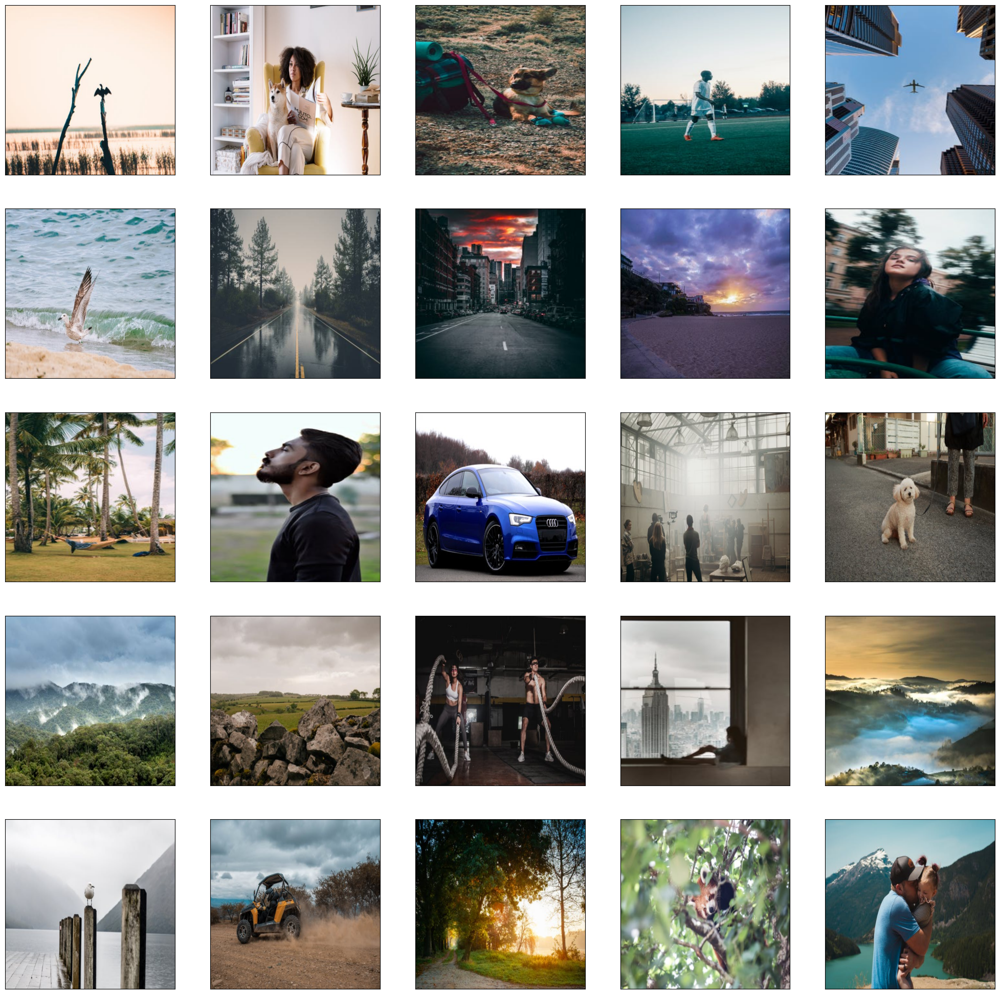

In [19]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB))
plt.show()

# Methods for data augmentation

In [20]:
# Functions to data augment images 

def data_augmentation(inputImage): # run image through all augmentation methods
    return randomContrast(randomBrightness(inputImage)).numpy()
    # return randomCrop(randomFlip(inputImage)) # use augmentation methods without messing with colour 

def randomFlip(pic): # flips the image up and down before left and right at random
    return tf.image.random_flip_up_down(tf.image.random_flip_left_right(pic, 1), 1)

# def randomCrop(pic): # crops the image from a randomly defined width and height, that are under the intial image width and height
#     return tf.image.random_crop(pic, size=[random.randint(75,width), random.randint(75,height), 3], seed=None)

def randomBrightness(pic): # makes the image a random brightness from 1% to 20%
    return tf.image.random_brightness(pic, random.uniform(0.01, 0.2), 1)

def randomContrast(pic): # contrasts the image from 5% to 50%
    return tf.image.random_contrast(pic, 0.2, 0.7, 1)

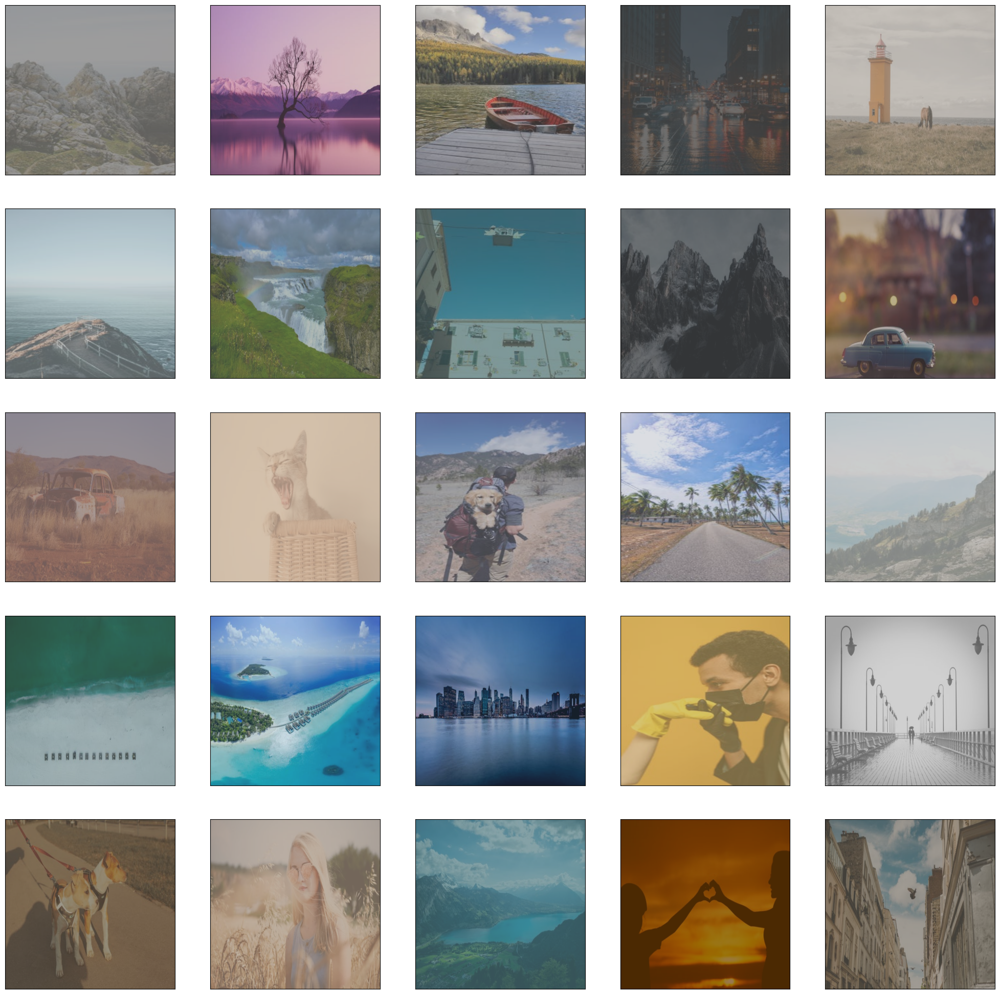

In [21]:
# Output Tensorflow data augmented images
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    augmented_image = data_augmentation(X_train[random.randint(1, len(X_train))]) # send 25 images into data augmentation
    plt.imshow(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB)) # not using cv2 as it messed up the code
plt.show()

In [22]:
#apply data augmentation to the X_train and y_train

data_augmented_X = [] 
data_augmented_y = []

for image in X_train:
    data_augmented_X.append(data_augmentation(image))
    
for image in y_train:
    data_augmented_y.append(data_augmentation(image))

# Data Augmentation Pictures

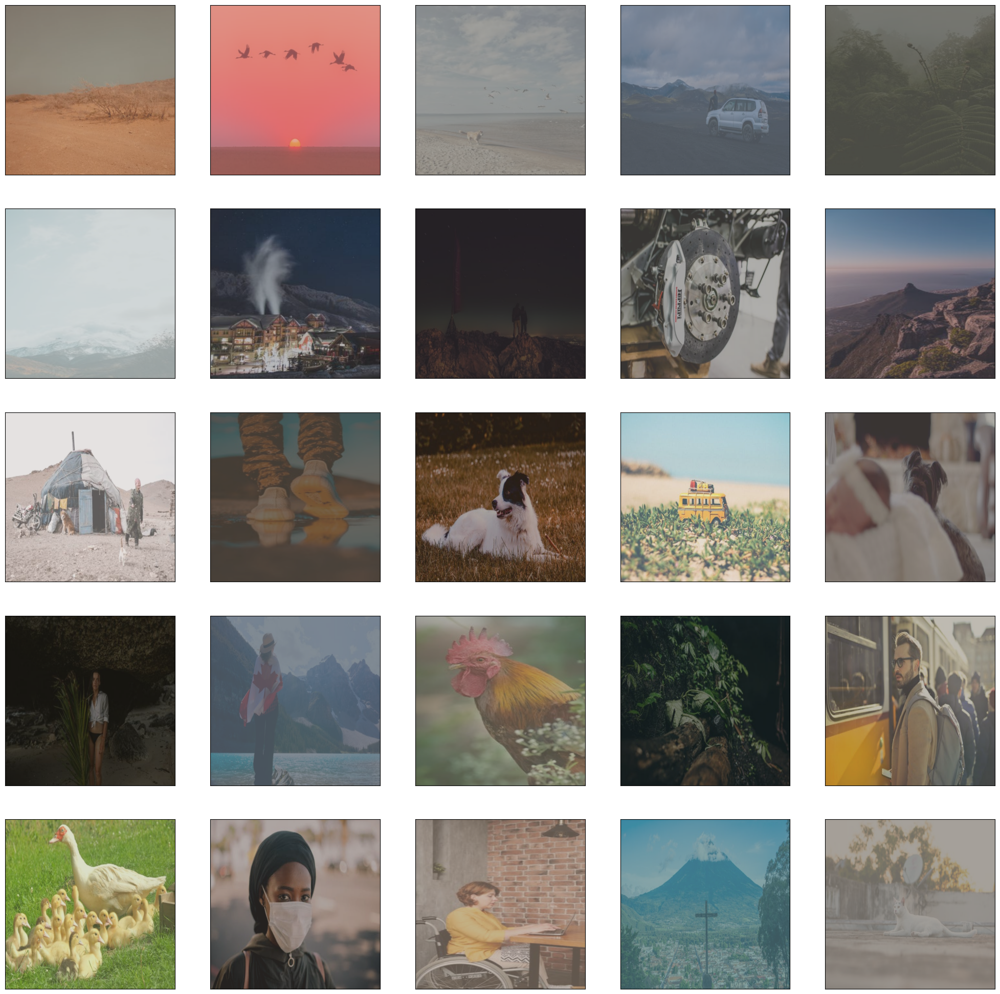

In [23]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_X[i], cv2.COLOR_BGR2RGB))
plt.show()

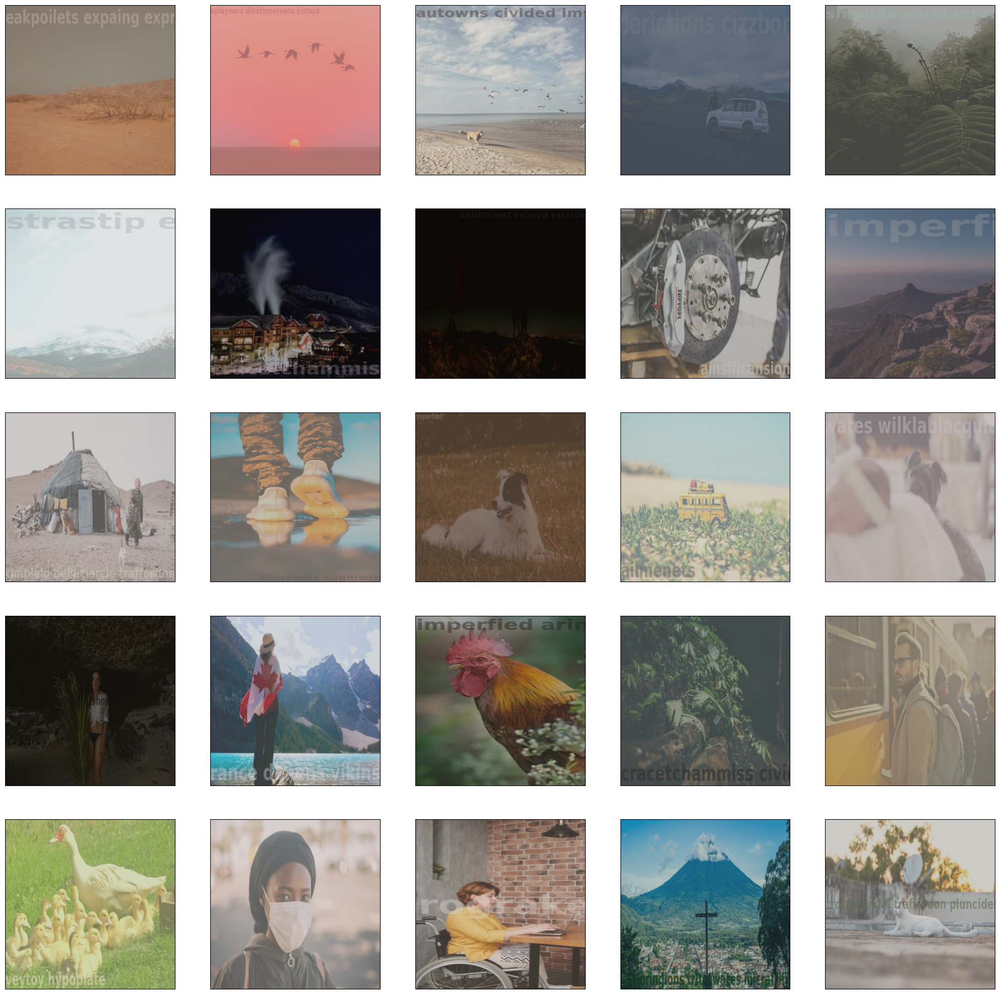

In [24]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_y[i], cv2.COLOR_BGR2RGB))
plt.show()

Combine the augmented images with the training sets

In [25]:
X_train = np.append(X_train, data_augmented_X, axis=0)
y_train = np.append(y_train, data_augmented_y, axis=0)

Normalizet the values between 0 and 1

In [ ]:
# normalize 
X_train = X_train / 255
y_train = y_train / 255
X_test = X_test / 255
y_test = y_test / 255

# Base convolutional autoencoder for Watermark Addition

In [ ]:
# Model for adding watermarks
# Input: Clean image -> Output: Watermarked image

def create_model(img_x, img_y):
    x = Input(shape=(img_x, img_y, 3))
    
    # Think this process as function composition in algebra 
    
    # Encoder - compresses the input into a latent representation
    e_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    pool1 = MaxPooling2D((2, 2), padding='same')(e_conv1)
    batchnorm_1 = BatchNormalization()(pool1)
    
    e_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(batchnorm_1)
    pool2 = MaxPooling2D((2, 2), padding='same')(e_conv2)
    batchnorm_2 = BatchNormalization()(pool2)
    
    e_conv3 = Conv2D(16, (3, 3), activation='relu', padding='same')(batchnorm_2)
    h = MaxPooling2D((2, 2), padding='same')(e_conv3)
    
    # Decoder - reconstructs the watermarked version from latent representation 
    d_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(h)
    up1 = UpSampling2D((2, 2))(d_conv1)
    
    d_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    up2 = UpSampling2D((2, 2))(d_conv2)
    
    d_conv3 = Conv2D(16, (3, 3), activation='relu')(up2)
    up3 = UpSampling2D((2, 2))(d_conv3)
    
    r = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(up3)
    
    model = Model(x, r)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')
    return model

In [ ]:
watermark_addition_model = create_model(width, height)
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
history = watermark_addition_model.fit(X_train, y_train, batch_size=20, epochs=100, callbacks=[early_stop])

# Results of the Watermark Addition Model

In [ ]:
# Predict watermarked versions from clean test images
result = watermark_addition_model.predict(X_test)
watermark_addition_model.evaluate(X_test, result)

In [ ]:
plt.imshow(cv2.cvtColor(result[5], cv2.COLOR_BGR2RGB))

# Input (Clean Images) vs Output (Predicted Watermarked Images)

In [ ]:
# Input: Clean images (no watermark)
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.suptitle('Input: Clean Images', fontsize=20)
plt.show()

In [ ]:
# Output: Predicted watermarked images
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(result[i], cv2.COLOR_BGR2RGB))
plt.suptitle('Output: Predicted Watermarked Images', fontsize=20)
plt.show()

# Save Model and Inference on New Images

In [ ]:
# Save the trained model
watermark_addition_model.save('watermark_addition_model.h5')
print("Model saved as 'watermark_addition_model.h5'")

In [ ]:
# Function to add watermark to a single new image
def add_watermark_to_image(image_path, model, width=196, height=196):
    """
    Takes a clean image and returns a watermarked version.
    
    Args:
        image_path: Path to the input clean image
        model: Trained watermark addition model
        width: Target width for resizing (default 196)
        height: Target height for resizing (default 196)
    
    Returns:
        watermarked_image: The image with watermark added
    """
    # Read and preprocess the image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    original_shape = img.shape[:2]  # Save original dimensions
    
    # Resize to model input size
    img_resized = cv2.resize(img, (width, height))
    
    # Normalize
    img_normalized = img_resized / 255.0
    
    # Add batch dimension
    img_batch = np.expand_dims(img_normalized, axis=0)
    
    # Predict watermarked version
    watermarked = model.predict(img_batch)[0]
    
    # Convert back to 0-255 range
    watermarked = (watermarked * 255).astype(np.uint8)
    
    # Optionally resize back to original dimensions
    watermarked_original_size = cv2.resize(watermarked, (original_shape[1], original_shape[0]))
    
    return watermarked, watermarked_original_size

# Example usage (uncomment to use):
# watermarked_small, watermarked_full = add_watermark_to_image('path/to/your/image.jpg', watermark_addition_model)
# plt.figure(figsize=(10, 5))
# plt.subplot(1, 2, 1)
# plt.title('Original')
# plt.imshow(cv2.cvtColor(cv2.imread('path/to/your/image.jpg'), cv2.COLOR_BGR2RGB))
# plt.subplot(1, 2, 2)
# plt.title('Watermarked')
# plt.imshow(cv2.cvtColor(watermarked_full, cv2.COLOR_BGR2RGB))
# plt.show()

In [ ]:
# To load the model later for inference (in a new session):
# from tensorflow.keras.models import load_model
# loaded_model = load_model('watermark_addition_model.h5')
# watermarked_small, watermarked_full = add_watermark_to_image('your_image.jpg', loaded_model)